# Brain MRI Tumor Classification - Exploratory Data Analysis

This notebook performs a complete pre-modeling audit of the Brain MRI tumor classification dataset. The objective is to understand dataset composition, image properties, quality risks, leakage risks, and likely preprocessing needs before any augmentation, model training, or evaluation is performed.

The dataset contains four diagnostic categories: `glioma`, `meningioma`, `pituitary`, and `notumor`. Because medical imaging models are sensitive to acquisition differences, image borders, duplicate leakage, class imbalance, and intensity shifts, this EDA treats the dataset as a research artifact rather than a simple folder of images.


## 2 Import Libraries

The imports below include numerical computing, plotting, image processing, hashing, statistics, and optional deep-feature tooling. Optional libraries are handled gracefully where possible, while core EDA dependencies are validated early with clear error messages.


In [7]:
import sys

print("Python:", sys.version)
print("Executable:", sys.executable)

Python: 3.13.14 (tags/v3.13.14:fd17997, Jun 10 2026, 13:03:48) [MSC v.1944 64 bit (AMD64)]
Executable: c:\Users\Prajwal\AppData\Local\Programs\Python\Python313\python.exe


In [8]:
import skimage, skimage.metrics; print('skimage', skimage.version)

AttributeError: No skimage attribute version

In [9]:
import sys
import sklearn

print("Python:", sys.version)
print("Executable:", sys.executable)
print("sklearn:", sklearn.__version__)

Python: 3.13.14 (tags/v3.13.14:fd17997, Jun 10 2026, 13:03:48) [MSC v.1944 64 bit (AMD64)]
Executable: c:\Users\Prajwal\AppData\Local\Programs\Python\Python313\python.exe
sklearn: 1.9.0


In [10]:
import sys

print("Python:", sys.version)
print("Executable:", sys.executable)

Python: 3.13.14 (tags/v3.13.14:fd17997, Jun 10 2026, 13:03:48) [MSC v.1944 64 bit (AMD64)]
Executable: c:\Users\Prajwal\AppData\Local\Programs\Python\Python313\python.exe


In [11]:
from __future__ import annotations

import hashlib
import math
import os
import random
import warnings
from collections import Counter, defaultdict
from dataclasses import dataclass
from pathlib import Path
from typing import Any, Dict, Iterable, List, Optional, Sequence, Tuple
import glob

warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from PIL import Image, ImageChops, ImageEnhance, ImageOps, UnidentifiedImageError
from tqdm.auto import tqdm

try:
    import cv2
except Exception as exc:
    raise ImportError("OpenCV is required. Install with: pip install opencv-python") from exc

try:
    from scipy import stats
    from scipy.spatial.distance import cosine
except Exception as exc:
    raise ImportError("SciPy is required. Install with: pip install scipy") from exc

try:
    import imagehash
except Exception as exc:
    raise ImportError("imagehash is required. Install with: pip install ImageHash") from exc

try:
    from skimage import exposure
    from skimage.metrics import structural_similarity as ssim
    from skimage.measure import shannon_entropy
    from skimage.transform import resize
except Exception as exc:
    raise ImportError("scikit-image is required. Install with: pip install scikit-image") from exc

try:
    from sklearn.decomposition import PCA
    from sklearn.manifold import TSNE
    from sklearn.preprocessing import StandardScaler
except Exception as exc:
    raise ImportError("scikit-learn is required. Install with: pip install scikit-learn") from exc

try:
    import torch
    import torchvision.transforms as T
    from torchvision.models import resnet18, ResNet18_Weights
    TORCH_AVAILABLE = True
except Exception:
    TORCH_AVAILABLE = False

try:
    import umap
    UMAP_AVAILABLE = True
except Exception:
    UMAP_AVAILABLE = False

SEED = 42
random.seed(SEED)
np.random.seed(SEED)

PROJECT_ROOT = Path.cwd()
DATA_ROOT = PROJECT_ROOT / "data"
IMAGE_EXTENSIONS = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff"}

MAX_FULL_IMAGE_METRICS = 10_000
MAX_PHASH_COMPARISONS = 3_000
MAX_SIMILARITY_PAIRS = 80
MAX_FEATURE_IMAGES = 512

plt.rcParams.update({
    "figure.dpi": 140,
    "savefig.dpi": 220,
    "font.size": 10,
    "axes.titlesize": 12,
    "axes.labelsize": 10,
    "axes.grid": True,
    "grid.alpha": 0.25,
})
sns.set_context("notebook")
print(f"Project root: {PROJECT_ROOT}")
print(f"Random seed: {SEED}")


Project root: e:\EffiNet
Random seed: 42


## 3 Dataset Discovery

This section automatically locates `Training` and `Testing` directories, discovers classes from folder names, counts images, and builds the master metadata table. No image filenames or class names are hardcoded into the discovery logic.


In [12]:
def find_split_folder(root: Path, split_name: str) -> Path:
    """Find a dataset split folder by name, case-insensitively."""
    matches = [p for p in root.rglob("*") if p.is_dir() and p.name.lower() == split_name.lower()]
    if not matches:
        raise FileNotFoundError(f"Could not find a '{split_name}' folder under {root.resolve()}")
    return sorted(matches, key=lambda p: len(p.parts))[0]


def discover_image_paths(split_dir: Path, split_name: str) -> pd.DataFrame:
    """Create a basic dataframe of image paths, class labels, and split names."""
    records: List[Dict[str, Any]] = []
    class_dirs = sorted([p for p in split_dir.iterdir() if p.is_dir()], key=lambda p: p.name.lower())
    for class_dir in class_dirs:
        image_paths = sorted([p for p in class_dir.rglob("*") if p.suffix.lower() in IMAGE_EXTENSIONS])
        for path in image_paths:
            records.append({"image_path": path, "class": class_dir.name, "split": split_name})
    return pd.DataFrame(records)


def read_image_metadata(path: Path) -> Dict[str, Any]:
    """Read lightweight image metadata with robust error handling."""
    row = {
        "width": np.nan,
        "height": np.nan,
        "channels": np.nan,
        "mode": None,
        "file_size_bytes": path.stat().st_size if path.exists() else np.nan,
        "readable": False,
        "error": None,
    }
    try:
        with Image.open(path) as img:
            row["width"], row["height"] = img.size
            row["mode"] = img.mode
            row["channels"] = len(img.getbands())
            img.verify()
            row["readable"] = True
    except Exception as exc:
        row["error"] = str(exc)
    return row


def build_metadata_table(data_root: Path = DATA_ROOT) -> Tuple[pd.DataFrame, Path, Path]:
    """Discover dataset split folders and return a complete metadata dataframe."""
    training_dir = find_split_folder(data_root, "Training")
    testing_dir = find_split_folder(data_root, "Testing")
    base_df = pd.concat(
        [
            discover_image_paths(training_dir, "Training"),
            discover_image_paths(testing_dir, "Testing"),
        ],
        ignore_index=True,
    )
    metadata = [read_image_metadata(Path(p)) for p in tqdm(base_df["image_path"], desc="Reading image metadata")]
    meta_df = pd.concat([base_df, pd.DataFrame(metadata)], axis=1)
    meta_df["filename"] = meta_df["image_path"].map(lambda p: Path(p).name)
    meta_df["aspect_ratio"] = meta_df["width"] / meta_df["height"]
    meta_df["resolution"] = meta_df["width"].astype("Int64").astype(str) + "x" + meta_df["height"].astype("Int64").astype(str)
    return meta_df, training_dir, testing_dir


df, TRAINING_DIR, TESTING_DIR = build_metadata_table()
classes = sorted(df["class"].unique())

summary_counts = {
    "Training images": int((df["split"] == "Training").sum()),
    "Testing images": int((df["split"] == "Testing").sum()),
    "Total images": int(len(df)),
    "Class names": ", ".join(classes),
}
display(pd.DataFrame(summary_counts.items(), columns=["Metric", "Value"]))
display(df.head())


Reading image metadata:   0%|          | 0/7200 [00:00<?, ?it/s]

,Metric,Value
0,Training images,5600
1,Testing images,1600
2,Total images,7200
3,Class names,"glioma, meningioma, notumor, pituitary"


,image_path,class,split,width,height,channels,mode,file_size_bytes,readable,error,filename,aspect_ratio,resolution
0,e:\EffiNet\data\archive\Training\glioma\Tr-gl_...,glioma,Training,512,512,1,L,20892,True,None,Tr-gl_1.jpg,1.0,512x512
1,e:\EffiNet\data\archive\Training\glioma\Tr-gl_...,glioma,Training,512,512,1,L,26456,True,None,Tr-gl_10.jpg,1.0,512x512
2,e:\EffiNet\data\archive\Training\glioma\Tr-gl_...,glioma,Training,512,512,1,L,20150,True,None,Tr-gl_100.jpg,1.0,512x512
3,e:\EffiNet\data\archive\Training\glioma\Tr-gl_...,glioma,Training,512,512,1,L,24892,True,None,Tr-gl_1000.jpg,1.0,512x512
4,e:\EffiNet\data\archive\Training\glioma\Tr-gl_...,glioma,Training,512,512,1,L,14756,True,None,Tr-gl_1001.jpg,1.0,512x512


## 4 Dataset Statistics

The dataset-level statistics below quantify scale, class composition, image dimensions, aspect ratios, and file sizes. These values guide downstream decisions such as target input resolution, batching cost, normalization, and whether class balancing is needed.


In [13]:
def dataset_statistics(frame: pd.DataFrame) -> Dict[str, Any]:
    """Compute global image and class statistics."""
    valid = frame[frame["readable"]].copy()
    stats_dict = {
        "total_images": len(frame),
        "training_images": int((frame["split"] == "Training").sum()),
        "testing_images": int((frame["split"] == "Testing").sum()),
        "images_per_class": frame.groupby(["split", "class"]).size().unstack(fill_value=0),
        "largest_image": valid.loc[(valid["width"] * valid["height"]).idxmax(), ["filename", "class", "split", "width", "height"]].to_dict(),
        "smallest_image": valid.loc[(valid["width"] * valid["height"]).idxmin(), ["filename", "class", "split", "width", "height"]].to_dict(),
        "average_width": valid["width"].mean(),
        "average_height": valid["height"].mean(),
        "median_width": valid["width"].median(),
        "median_height": valid["height"].median(),
        "aspect_ratio_summary": valid["aspect_ratio"].describe(),
        "file_size_summary_kb": (valid["file_size_bytes"] / 1024).describe(),
    }
    return stats_dict


stats_summary = dataset_statistics(df)
print(f"Total images: {stats_summary['total_images']:,}")
print(f"Training images: {stats_summary['training_images']:,}")
print(f"Testing images: {stats_summary['testing_images']:,}")
print(f"Average width x height: {stats_summary['average_width']:.1f} x {stats_summary['average_height']:.1f}")
print(f"Median width x height: {stats_summary['median_width']:.0f} x {stats_summary['median_height']:.0f}")
print("\nImages per class:")
display(stats_summary["images_per_class"])
print("Largest image:", stats_summary["largest_image"])
print("Smallest image:", stats_summary["smallest_image"])
print("\nAspect ratio statistics:")
display(stats_summary["aspect_ratio_summary"].to_frame("aspect_ratio"))


Total images: 7,200
Training images: 5,600
Testing images: 1,600
Average width x height: 453.3 x 456.9
Median width x height: 512 x 512

Images per class:


class,glioma,meningioma,notumor,pituitary
split,,,,
Testing,400,400,400,400
Training,1400,1400,1400,1400


Largest image: {'filename': 'Tr-no_258.jpg', 'class': 'notumor', 'split': 'Training', 'width': 1375, 'height': 1446}
Smallest image: {'filename': 'Te-gl_350.jpg', 'class': 'glioma', 'split': 'Testing', 'width': 175, 'height': 167}

Aspect ratio statistics:


,aspect_ratio
count,7200.000000
mean,0.989699
std,0.091677
min,0.644809
25%,1.000000
50%,1.000000
75%,1.000000
max,1.785714


## 5 Class Distribution

Class balance affects optimization, calibration, and macro-averaged evaluation. The bar chart, pie chart, and table show whether the classifier will see roughly equal representation across tumor categories and the non-tumor group.


In [14]:
def plot_class_distribution(frame: pd.DataFrame) -> pd.DataFrame:
    """Render interactive class-distribution plots and return the count table."""
    counts = frame.groupby(["split", "class"]).size().reset_index(name="count")
    totals = frame.groupby("class").size().reset_index(name="total_count")
    totals["percent"] = totals["total_count"] / totals["total_count"].sum() * 100

    fig_bar = px.bar(
        counts,
        x="class",
        y="count",
        color="split",
        barmode="group",
        text="count",
        title="Class Distribution by Dataset Split",
        labels={"class": "Class", "count": "Number of Images"},
    )
    fig_bar.update_layout(template="plotly_white", xaxis_title=None)
    fig_bar.show()

    fig_pie = px.pie(
        totals,
        names="class",
        values="total_count",
        title="Overall Class Composition",
        hole=0.35,
    )
    fig_pie.update_traces(textposition="inside", textinfo="percent+label")
    fig_pie.update_layout(template="plotly_white")
    fig_pie.show()
    return totals.sort_values("total_count", ascending=False)


class_distribution = plot_class_distribution(df)
display(class_distribution)

imbalance_ratio = class_distribution["total_count"].max() / class_distribution["total_count"].min()
print(f"Max/min class count ratio: {imbalance_ratio:.2f}")
if imbalance_ratio > 1.5:
    print("Conclusion: the dataset shows material class imbalance; use stratified sampling and consider class-weighted loss.")
else:
    print("Conclusion: the dataset is reasonably balanced at the class-count level.")


,class,total_count,percent
0,glioma,1800,25.0
1,meningioma,1800,25.0
2,notumor,1800,25.0
3,pituitary,1800,25.0


Max/min class count ratio: 1.00
Conclusion: the dataset is reasonably balanced at the class-count level.


## 6 Image Resolution Analysis

Resolution heterogeneity determines how aggressive resizing must be and whether resizing could distort anatomy. The analysis uses width, height, aspect ratio, scatter plots, and boxplots to identify common image sizes and outliers.


In [15]:
def analyze_resolutions(frame: pd.DataFrame) -> pd.DataFrame:
    """Plot image dimension distributions and return common resolutions."""
    valid = frame[frame["readable"]].copy()
    common_res = valid["resolution"].value_counts().head(10).rename_axis("resolution").reset_index(name="count")

    fig = px.histogram(valid, x="width", color="split", nbins=50, marginal="box", title="Width Distribution")
    fig.update_layout(template="plotly_white")
    fig.show()

    fig = px.histogram(valid, x="height", color="split", nbins=50, marginal="box", title="Height Distribution")
    fig.update_layout(template="plotly_white")
    fig.show()

    fig = px.scatter(
        valid.sample(min(len(valid), 2500), random_state=SEED),
        x="width",
        y="height",
        color="class",
        symbol="split",
        opacity=0.65,
        title="Image Width vs Height",
        hover_data=["filename", "resolution"],
    )
    fig.update_layout(template="plotly_white")
    fig.show()

    fig = px.box(valid, x="class", y="aspect_ratio", color="split", title="Aspect Ratio by Class and Split")
    fig.update_layout(template="plotly_white", xaxis_title=None)
    fig.show()

    print(f"Minimum resolution: {valid.loc[(valid.width * valid.height).idxmin(), 'resolution']}")
    print(f"Maximum resolution: {valid.loc[(valid.width * valid.height).idxmax(), 'resolution']}")
    print(f"Median resolution: {int(valid.width.median())}x{int(valid.height.median())}")
    print(f"Most common resolution: {common_res.iloc[0]['resolution']} ({common_res.iloc[0]['count']} images)")
    return common_res


common_resolutions = analyze_resolutions(df)
display(common_resolutions)


Minimum resolution: 175x167
Maximum resolution: 1375x1446
Median resolution: 512x512
Most common resolution: 512x512 (5014 images)


,resolution,count
0,512x512,5014
1,225x225,338
2,630x630,90
3,201x251,57
4,228x221,51
5,232x217,50
6,442x442,48
7,236x236,48
8,150x198,44
9,200x252,43


## 7 Color Channel Analysis

Brain MRI datasets are often grayscale but stored as RGB JPEGs. This section checks file modes, channel counts, mean RGB values, and example channel histograms to determine whether color channels contain distinct information or duplicated grayscale signal.


Analyzing color channels:   0%|          | 0/800 [00:00<?, ?it/s]

,mode,channels,count
0,L,1,3067
1,P,1,1
2,RGB,3,4129
3,RGBA,4,3


,mean_r,mean_g,mean_b,rgb_channels_identical
class,,,,
glioma,35.549347,35.549347,35.549347,1.000000
meningioma,42.981875,42.981875,42.981875,1.000000
notumor,63.402490,63.391041,63.396338,0.934343
pituitary,48.563081,48.563081,48.563081,1.000000


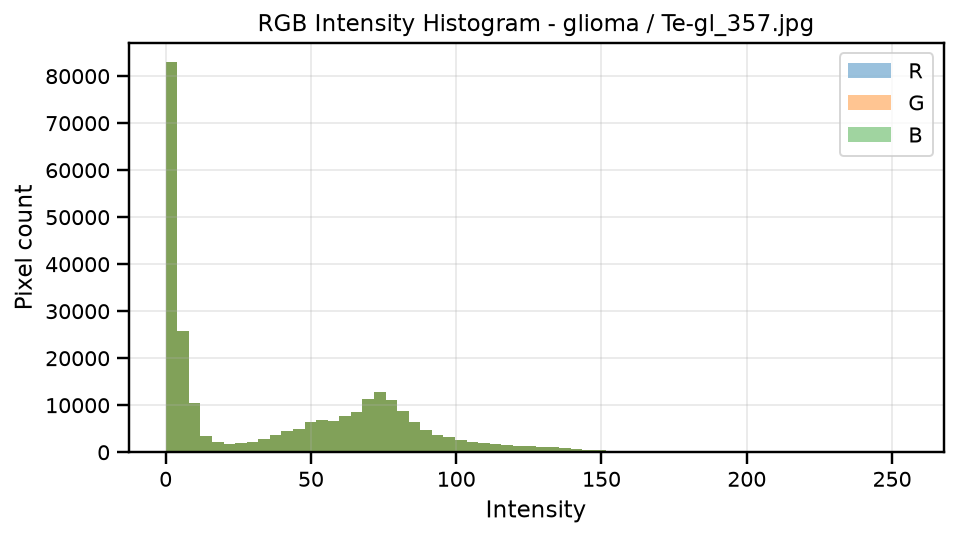

Estimated grayscale-as-RGB rate: 98.4%


In [16]:
def load_rgb(path: Path, size: Optional[Tuple[int, int]] = None) -> np.ndarray:
    """Load an image as RGB uint8, optionally resized."""
    with Image.open(path) as img:
        img = img.convert("RGB")
        if size is not None:
            img = img.resize(size, Image.BILINEAR)
        return np.asarray(img)


def is_grayscale_rgb(arr: np.ndarray, tolerance: int = 2) -> bool:
    """Return True when RGB channels are nearly identical."""
    return bool(
        np.max(np.abs(arr[..., 0].astype(int) - arr[..., 1].astype(int))) <= tolerance
        and np.max(np.abs(arr[..., 1].astype(int) - arr[..., 2].astype(int))) <= tolerance
    )


def color_channel_analysis(frame: pd.DataFrame, sample_size: int = 800) -> pd.DataFrame:
    """Analyze channel counts and mean RGB values on a bounded sample."""
    valid = frame[frame["readable"]].sample(min(sample_size, frame["readable"].sum()), random_state=SEED)
    rows = []
    for _, row in tqdm(valid.iterrows(), total=len(valid), desc="Analyzing color channels"):
        arr = load_rgb(Path(row.image_path), size=(128, 128))
        rows.append({
            "image_path": row.image_path,
            "class": row["class"],
            "split": row["split"],
            "mean_r": arr[..., 0].mean(),
            "mean_g": arr[..., 1].mean(),
            "mean_b": arr[..., 2].mean(),
            "rgb_channels_identical": is_grayscale_rgb(arr),
        })
    color_df = pd.DataFrame(rows)
    display(frame.groupby(["mode", "channels"]).size().reset_index(name="count"))
    display(color_df.groupby("class")[["mean_r", "mean_g", "mean_b", "rgb_channels_identical"]].mean())

    example = valid.sample(1, random_state=SEED).iloc[0]
    arr = load_rgb(Path(example.image_path))
    plt.figure(figsize=(7, 4))
    for idx, channel in enumerate(["R", "G", "B"]):
        plt.hist(arr[..., idx].ravel(), bins=64, alpha=0.45, label=channel)
    plt.title(f"RGB Intensity Histogram - {example['class']} / {example['filename']}")
    plt.xlabel("Intensity")
    plt.ylabel("Pixel count")
    plt.legend()
    plt.tight_layout()
    plt.show()
    print(f"Estimated grayscale-as-RGB rate: {color_df['rgb_channels_identical'].mean() * 100:.1f}%")
    return color_df


color_metrics = color_channel_analysis(df)


## 8 Pixel Intensity Analysis

Intensity statistics summarize tissue/background brightness and noise-like variation. They also reveal whether class or split differences could arise from acquisition or preprocessing artifacts rather than anatomy.


In [17]:
def compute_image_metrics(path: Path, resize_to: Tuple[int, int] = (160, 160)) -> Dict[str, float]:
    """Compute grayscale intensity, entropy, sharpness, contrast, and dynamic-range metrics."""
    gray = np.asarray(Image.open(path).convert("L").resize(resize_to, Image.BILINEAR))
    lap_var = float(cv2.Laplacian(gray, cv2.CV_64F).var())
    p1, p99 = np.percentile(gray, [1, 99])
    return {
        "mean_intensity": float(gray.mean()),
        "std_intensity": float(gray.std()),
        "min_intensity": float(gray.min()),
        "max_intensity": float(gray.max()),
        "entropy": float(shannon_entropy(gray)),
        "sharpness_laplacian_var": lap_var,
        "brightness": float(gray.mean()),
        "contrast": float(gray.std()),
        "dynamic_range": float(gray.max() - gray.min()),
        "robust_dynamic_range": float(p99 - p1),
    }


def build_metric_table(frame: pd.DataFrame) -> pd.DataFrame:
    """Compute image-level metrics, bounded to keep notebook runtime practical."""
    valid = frame[frame["readable"]].copy()
    if len(valid) > MAX_FULL_IMAGE_METRICS:
        valid = valid.sample(MAX_FULL_IMAGE_METRICS, random_state=SEED)
    rows = []
    for _, row in tqdm(valid.iterrows(), total=len(valid), desc="Computing pixel metrics"):
        try:
            rows.append({**row.to_dict(), **compute_image_metrics(Path(row.image_path))})
        except Exception as exc:
            rows.append({**row.to_dict(), "metric_error": str(exc)})
    return pd.DataFrame(rows)


metrics_df = build_metric_table(df)
display(metrics_df[["class", "split", "mean_intensity", "std_intensity", "entropy", "sharpness_laplacian_var", "contrast"]].describe())

fig = px.histogram(metrics_df, x="mean_intensity", color="class", nbins=60, opacity=0.65, title="Mean Grayscale Intensity by Class")
fig.update_layout(template="plotly_white", barmode="overlay")
fig.show()

fig = px.violin(metrics_df, x="class", y="mean_intensity", color="split", box=True, title="Class-wise Pixel Intensity Distributions")
fig.update_layout(template="plotly_white", xaxis_title=None)
fig.show()

fig = px.histogram(metrics_df, x="entropy", color="class", nbins=60, opacity=0.65, title="Entropy Distribution by Class")
fig.update_layout(template="plotly_white", barmode="overlay")
fig.show()


Computing pixel metrics:   0%|          | 0/7200 [00:00<?, ?it/s]

,mean_intensity,std_intensity,entropy,sharpness_laplacian_var,contrast
count,7200.000000,7200.000000,7200.000000,7200.000000,7200.000000
mean,47.563677,45.537765,5.867607,953.340422,45.537765
std,17.827749,12.232831,0.747545,1372.055698,12.232831
min,14.952891,20.003311,3.207853,43.607142,20.003311
25%,35.326816,37.877919,5.396492,439.640205,37.877919
50%,44.311738,42.476656,5.946889,591.733327,42.476656
75%,54.502432,48.890737,6.445228,829.216002,48.890737
max,137.772617,97.276774,7.794431,17501.154350,97.276774


## 9 Sample Visualization

Random visual inspection is still essential in medical imaging EDA. The grid below samples 12 images per class and annotates filename, class, and resolution so obvious labeling or quality issues can be spotted quickly.


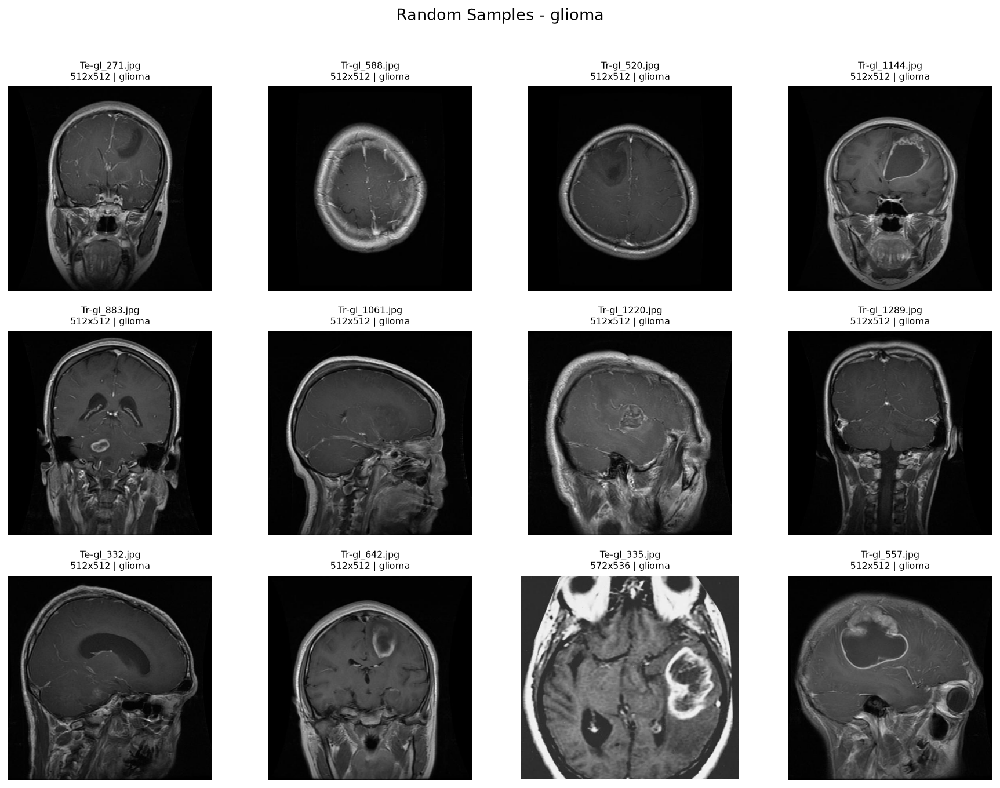

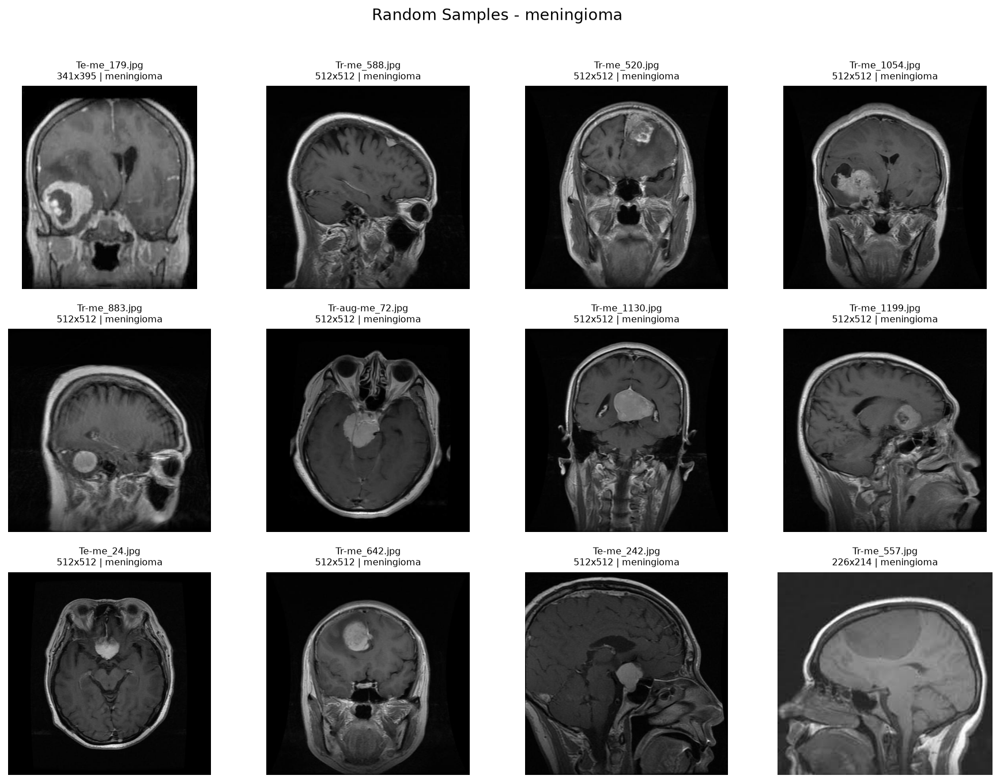

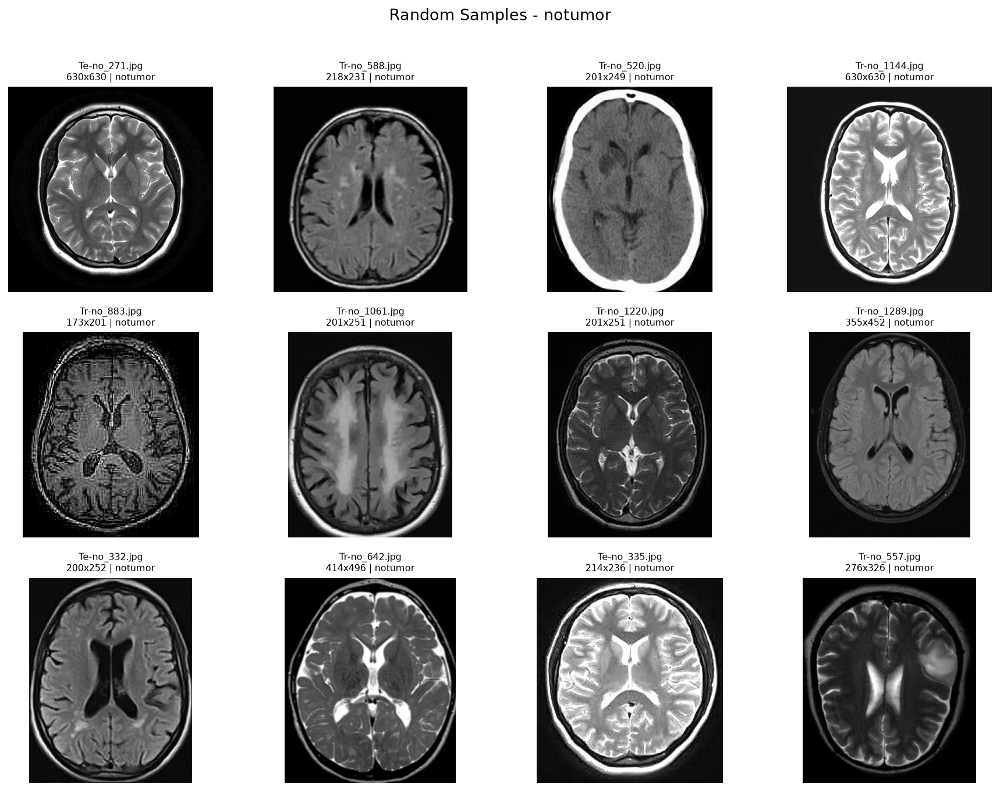

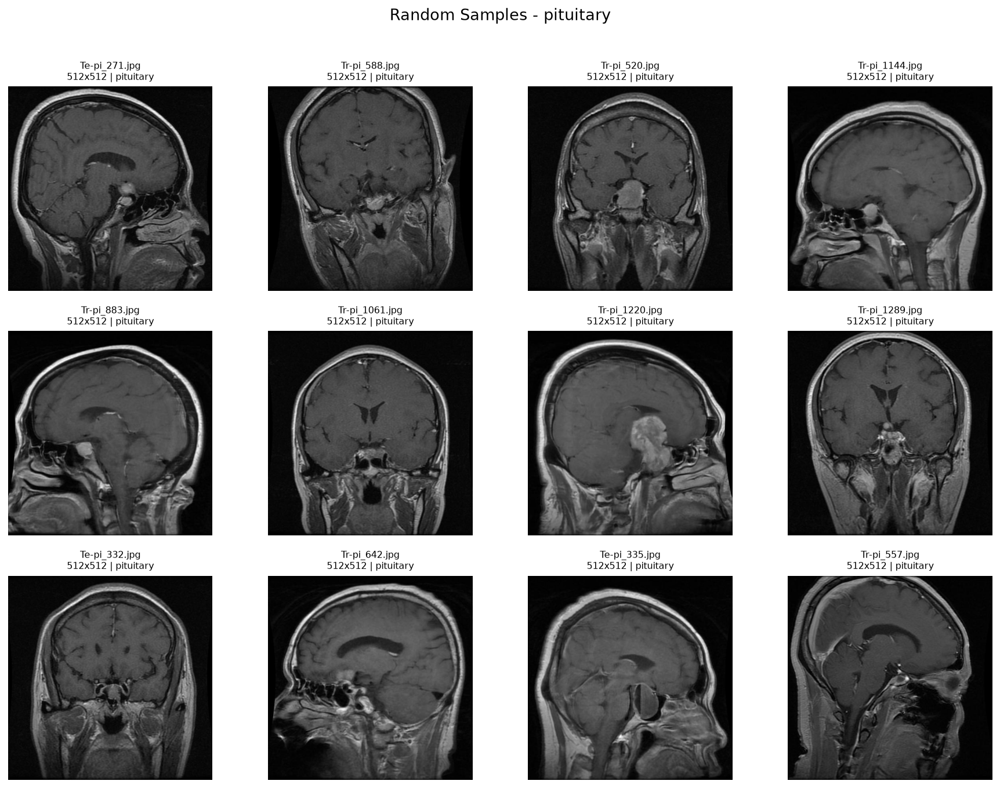

In [18]:
def show_class_samples(frame: pd.DataFrame, samples_per_class: int = 12) -> None:
    """Display random image samples for every class."""
    for cls in sorted(frame["class"].unique()):
        subset = frame[(frame["class"] == cls) & (frame["readable"])]
        sample = subset.sample(min(samples_per_class, len(subset)), random_state=SEED)
        ncols = 4
        nrows = math.ceil(len(sample) / ncols)
        fig, axes = plt.subplots(nrows, ncols, figsize=(13, 3.2 * nrows))
        axes = np.array(axes).reshape(-1)
        for ax, (_, row) in zip(axes, sample.iterrows()):
            arr = load_rgb(Path(row.image_path))
            ax.imshow(arr, cmap="gray")
            ax.set_title(f"{row['filename']}\n{row['resolution']} | {row['class']}", fontsize=8)
            ax.axis("off")
        for ax in axes[len(sample):]:
            ax.axis("off")
        fig.suptitle(f"Random Samples - {cls}", fontsize=14, y=1.01)
        plt.tight_layout()
        plt.show()


show_class_samples(df, samples_per_class=12)


## 10 Image Quality Assessment

This section flags unreadable, corrupted, zero-byte, blank, and extremely small files. These images should be reviewed before training because they can break data loaders or teach non-diagnostic artifacts.


In [19]:
def assess_quality(frame: pd.DataFrame) -> pd.DataFrame:
    """Detect basic quality failures and suspicious images."""
    rows = []
    for _, row in tqdm(frame.iterrows(), total=len(frame), desc="Assessing quality"):
        path = Path(row.image_path)
        issue = {
            "image_path": path,
            "filename": row.filename,
            "class": row["class"],
            "split": row["split"],
            "zero_byte": bool(path.exists() and path.stat().st_size == 0),
            "unreadable": not bool(row.readable),
            "extremely_small": bool(row.readable and (row.width < 64 or row.height < 64)),
            "blank_image": False,
        }
        if row.readable:
            try:
                gray = np.asarray(Image.open(path).convert("L").resize((96, 96)))
                issue["blank_image"] = bool(gray.std() < 1.0)
            except Exception:
                issue["unreadable"] = True
        rows.append(issue)
    quality = pd.DataFrame(rows)
    issue_cols = ["zero_byte", "unreadable", "extremely_small", "blank_image"]
    quality["has_issue"] = quality[issue_cols].any(axis=1)
    display(quality[issue_cols + ["has_issue"]].sum().to_frame("count"))
    return quality


quality_df = assess_quality(df)
display(quality_df[quality_df["has_issue"]].head(20))


Assessing quality:   0%|          | 0/7200 [00:00<?, ?it/s]

,count
zero_byte,0
unreadable,0
extremely_small,0
blank_image,0
has_issue,0


,image_path,filename,class,split,zero_byte,unreadable,extremely_small,blank_image,has_issue


## 11 Duplicate Detection

Duplicates can inflate performance if they appear across training and testing splits. This section uses MD5 for exact file duplicates and perceptual hash (pHash) for visually near-identical images.


Hashing images:   0%|          | 0/7200 [00:00<?, ?it/s]

Comparing pHashes:   0%|          | 0/3000 [00:00<?, ?it/s]

Exact duplicate image records: 340
Near duplicate pairs with pHash distance <= 4: 1083


,image_path,class,split,width,height,channels,mode,file_size_bytes,readable,error,filename,aspect_ratio,resolution,md5,phash
4931,e:\EffiNet\data\archive\Training\pituitary\Tr-...,pituitary,Training,350,400,3,RGB,29953,True,None,Tr-pi_397.jpg,0.875000,350x400,00748c6aaa5c199b07f8fa7140fc19c1,f54a00ff488dd669
4808,e:\EffiNet\data\archive\Training\pituitary\Tr-...,pituitary,Training,350,400,3,RGB,29953,True,None,Tr-pi_286.jpg,0.875000,350x400,00748c6aaa5c199b07f8fa7140fc19c1,f54a00ff488dd669
4831,e:\EffiNet\data\archive\Training\pituitary\Tr-...,pituitary,Training,900,741,3,RGB,189502,True,None,Tr-pi_306.jpg,1.214575,900x741,008c98403b057fc344bf0a9f2e7de6c2,959f1e586b1af418
4679,e:\EffiNet\data\archive\Training\pituitary\Tr-...,pituitary,Training,900,741,3,RGB,189502,True,None,Tr-pi_17.jpg,1.214575,900x741,008c98403b057fc344bf0a9f2e7de6c2,959f1e586b1af418
4310,e:\EffiNet\data\archive\Training\pituitary\Tr-...,pituitary,Training,512,512,3,RGB,38348,True,None,Tr-pi_1098.jpg,1.000000,512x512,0140560cc9a91abc3e62e9e1bec6c5ea,c03d2ff03d743364
4374,e:\EffiNet\data\archive\Training\pituitary\Tr-...,pituitary,Training,512,512,3,RGB,38348,True,None,Tr-pi_1155.jpg,1.000000,512x512,0140560cc9a91abc3e62e9e1bec6c5ea,c03d2ff03d743364
4737,e:\EffiNet\data\archive\Training\pituitary\Tr-...,pituitary,Training,512,512,3,RGB,32090,True,None,Tr-pi_221.jpg,1.000000,512x512,05c3caea567ffd77caf79c12654b87e5,d40b523e2bf57826
4969,e:\EffiNet\data\archive\Training\pituitary\Tr-...,pituitary,Training,512,512,3,RGB,32090,True,None,Tr-pi_430.jpg,1.000000,512x512,05c3caea567ffd77caf79c12654b87e5,d40b523e2bf57826
5471,e:\EffiNet\data\archive\Training\pituitary\Tr-...,pituitary,Training,512,512,3,RGB,32090,True,None,Tr-pi_883.jpg,1.000000,512x512,05c3caea567ffd77caf79c12654b87e5,d40b523e2bf57826
3804,e:\EffiNet\data\archive\Training\notumor\Tr-no...,notumor,Training,414,496,3,RGB,44008,True,None,Tr-no_642.jpg,0.834677,414x496,05fe39a899414d2dab6cad25c301b32c,9199569678e96a4d


,left_path,right_path,left_class,right_class,left_split,right_split,phash_distance
17,e:\EffiNet\data\archive\Training\pituitary\Tr-...,e:\EffiNet\data\archive\Training\pituitary\Tr-...,pituitary,pituitary,Training,Training,0
16,e:\EffiNet\data\archive\Training\pituitary\Tr-...,e:\EffiNet\data\archive\Training\pituitary\Tr-...,pituitary,pituitary,Training,Training,0
15,e:\EffiNet\data\archive\Training\notumor\Tr-no...,e:\EffiNet\data\archive\Training\notumor\Tr-no...,notumor,notumor,Training,Training,0
8,e:\EffiNet\data\archive\Training\notumor\Tr-no...,e:\EffiNet\data\archive\Testing\notumor\Te-no_...,notumor,notumor,Training,Testing,0
7,e:\EffiNet\data\archive\Training\notumor\Tr-no...,e:\EffiNet\data\archive\Training\notumor\Tr-no...,notumor,notumor,Training,Training,0
5,e:\EffiNet\data\archive\Training\meningioma\Tr...,e:\EffiNet\data\archive\Testing\meningioma\Te-...,meningioma,meningioma,Training,Testing,0
366,e:\EffiNet\data\archive\Training\notumor\Tr-no...,e:\EffiNet\data\archive\Training\notumor\Tr-no...,notumor,notumor,Training,Training,0
364,e:\EffiNet\data\archive\Training\notumor\Tr-no...,e:\EffiNet\data\archive\Training\notumor\Tr-no...,notumor,notumor,Training,Training,0
363,e:\EffiNet\data\archive\Training\notumor\Tr-no...,e:\EffiNet\data\archive\Testing\notumor\Te-no_...,notumor,notumor,Training,Testing,0
362,e:\EffiNet\data\archive\Training\notumor\Tr-no...,e:\EffiNet\data\archive\Training\notumor\Tr-no...,notumor,notumor,Training,Training,0


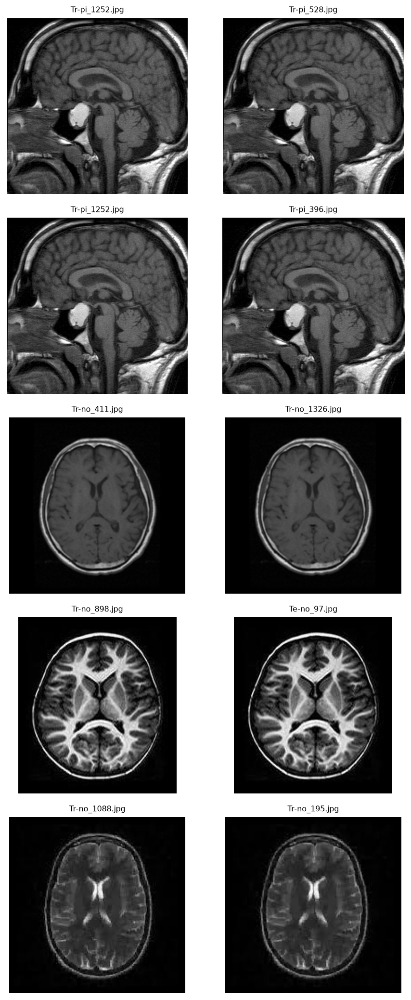

In [20]:
def md5_hash(path: Path, chunk_size: int = 1_048_576) -> str:
    """Compute MD5 hash for exact duplicate detection."""
    digest = hashlib.md5()
    with path.open("rb") as file:
        for chunk in iter(lambda: file.read(chunk_size), b""):
            digest.update(chunk)
    return digest.hexdigest()


def perceptual_hash(path: Path) -> str:
    """Compute pHash for perceptual duplicate detection."""
    with Image.open(path) as img:
        return str(imagehash.phash(img.convert("L")))


def duplicate_detection(frame: pd.DataFrame) -> Tuple[pd.DataFrame, pd.DataFrame]:
    """Find exact and near duplicates using MD5 and pHash."""
    valid = frame[frame["readable"]].copy()
    hash_rows = []
    for _, row in tqdm(valid.iterrows(), total=len(valid), desc="Hashing images"):
        path = Path(row.image_path)
        try:
            hash_rows.append({**row.to_dict(), "md5": md5_hash(path), "phash": perceptual_hash(path)})
        except Exception as exc:
            hash_rows.append({**row.to_dict(), "hash_error": str(exc)})
    hashes = pd.DataFrame(hash_rows)

    exact = hashes.groupby("md5").filter(lambda group: len(group) > 1).sort_values("md5")
    near_rows = []
    phash_sample = hashes.sample(min(len(hashes), MAX_PHASH_COMPARISONS), random_state=SEED).reset_index(drop=True)
    parsed_hashes = [(idx, imagehash.hex_to_hash(value)) for idx, value in enumerate(phash_sample["phash"]) if isinstance(value, str)]
    for i, (idx_i, hash_i) in enumerate(tqdm(parsed_hashes, desc="Comparing pHashes")):
        for idx_j, hash_j in parsed_hashes[i + 1:]:
            distance = hash_i - hash_j
            if distance <= 4:
                left = phash_sample.iloc[idx_i]
                right = phash_sample.iloc[idx_j]
                near_rows.append({
                    "left_path": left.image_path,
                    "right_path": right.image_path,
                    "left_class": left["class"],
                    "right_class": right["class"],
                    "left_split": left["split"],
                    "right_split": right["split"],
                    "phash_distance": int(distance),
                })
    near = pd.DataFrame(near_rows).sort_values("phash_distance") if near_rows else pd.DataFrame()
    print(f"Exact duplicate image records: {len(exact)}")
    print(f"Near duplicate pairs with pHash distance <= 4: {len(near)}")
    return exact, near


exact_duplicates, near_duplicates = duplicate_detection(df)
display(exact_duplicates.head(20))
display(near_duplicates.head(20) if len(near_duplicates) else pd.DataFrame({"message": ["No near duplicates found in sampled comparison."]}))


def display_duplicate_pairs(pairs: pd.DataFrame, max_pairs: int = 5) -> None:
    """Display duplicate or near-duplicate image pairs."""
    if pairs.empty:
        return
    sample = pairs.head(max_pairs)
    fig, axes = plt.subplots(len(sample), 2, figsize=(7, 3 * len(sample)))
    axes = np.array(axes).reshape(len(sample), 2)
    for row_idx, (_, row) in enumerate(sample.iterrows()):
        for col_idx, key in enumerate(["left_path", "right_path"]):
            axes[row_idx, col_idx].imshow(load_rgb(Path(row[key])))
            axes[row_idx, col_idx].set_title(Path(row[key]).name, fontsize=8)
            axes[row_idx, col_idx].axis("off")
    plt.tight_layout()
    plt.show()


display_duplicate_pairs(near_duplicates)


## 12 Border Analysis

MRI JPEGs often contain black borders or scanner padding. Border artifacts can become shortcuts for a classifier and can waste input pixels. This section estimates the fraction of low-intensity border pixels and demonstrates a possible crop.


Estimating borders:   0%|          | 0/800 [00:00<?, ?it/s]

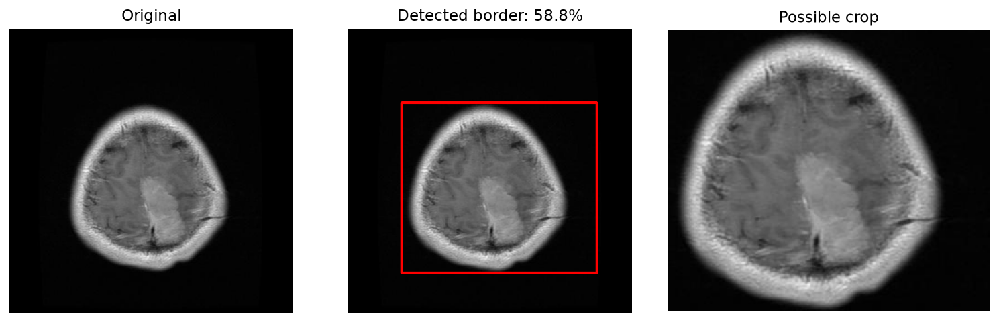

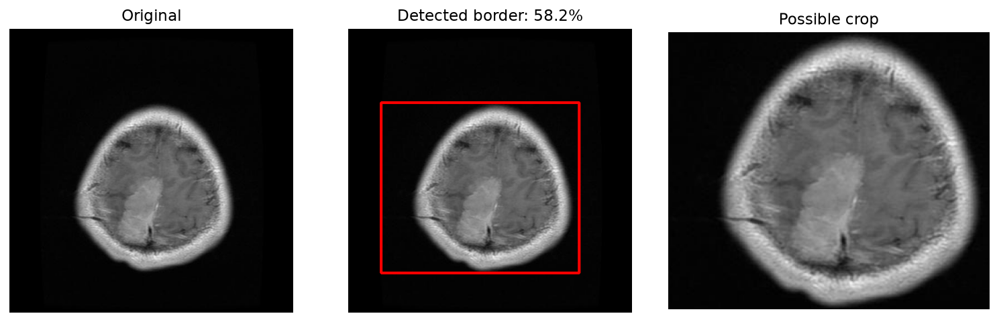

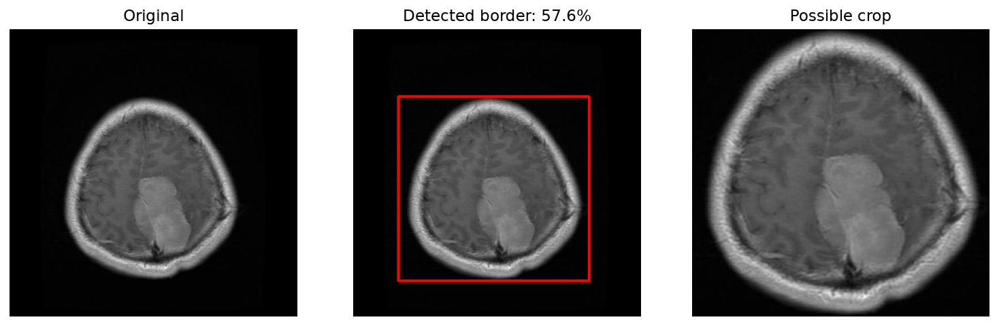

Median estimated border fraction: 13.04%
Recommendation: consider border-aware cropping if the high-border tail is clinically non-informative and consistent across labels.


In [21]:
def estimate_black_border(gray: np.ndarray, threshold: int = 8) -> Tuple[float, Tuple[int, int, int, int]]:
    """Estimate dark border fraction and crop box from a grayscale image."""
    mask = gray > threshold
    if not mask.any():
        return 1.0, (0, 0, gray.shape[1], gray.shape[0])
    ys, xs = np.where(mask)
    top, bottom = ys.min(), ys.max() + 1
    left, right = xs.min(), xs.max() + 1
    border_area = gray.size - ((bottom - top) * (right - left))
    return float(border_area / gray.size), (left, top, right, bottom)


def border_analysis(frame: pd.DataFrame, sample_size: int = 800) -> pd.DataFrame:
    """Compute border estimates and show examples."""
    valid = frame[frame["readable"]].sample(min(sample_size, frame["readable"].sum()), random_state=SEED)
    rows = []
    for _, row in tqdm(valid.iterrows(), total=len(valid), desc="Estimating borders"):
        gray = np.asarray(Image.open(row.image_path).convert("L"))
        border_fraction, crop_box = estimate_black_border(gray)
        rows.append({**row.to_dict(), "border_fraction": border_fraction, "crop_box": crop_box})
    border_df = pd.DataFrame(rows)
    fig = px.histogram(border_df, x="border_fraction", color="class", nbins=50, title="Estimated Black Border Fraction")
    fig.update_layout(template="plotly_white", barmode="overlay")
    fig.show()

    examples = border_df.sort_values("border_fraction", ascending=False).head(3)
    for _, row in examples.iterrows():
        img = Image.open(row.image_path).convert("RGB")
        cropped = img.crop(row.crop_box)
        overlay = img.copy()
        draw_arr = np.asarray(overlay).copy()
        left, top, right, bottom = row.crop_box
        cv2.rectangle(draw_arr, (left, top), (right, bottom), (255, 0, 0), 3)
        fig, axes = plt.subplots(1, 3, figsize=(11, 3.5))
        axes[0].imshow(img)
        axes[0].set_title("Original")
        axes[1].imshow(draw_arr)
        axes[1].set_title(f"Detected border: {row.border_fraction:.1%}")
        axes[2].imshow(cropped)
        axes[2].set_title("Possible crop")
        for ax in axes:
            ax.axis("off")
        plt.tight_layout()
        plt.show()
    return border_df


border_df = border_analysis(df)
print(f"Median estimated border fraction: {border_df['border_fraction'].median():.2%}")
print("Recommendation: consider border-aware cropping if the high-border tail is clinically non-informative and consistent across labels.")


## 13 Image Sharpness Analysis

Sharpness is estimated with variance of the Laplacian. Very low values indicate blurred images that can reduce useful anatomical detail or indicate preprocessing problems.


In [22]:
def sharpness_analysis(metrics: pd.DataFrame) -> pd.DataFrame:
    """Visualize and flag blurred and sharp images."""
    blur_threshold = metrics["sharpness_laplacian_var"].quantile(0.05)
    sharp_threshold = metrics["sharpness_laplacian_var"].quantile(0.95)
    flagged = metrics.assign(
        sharpness_flag=np.select(
            [
                metrics["sharpness_laplacian_var"] <= blur_threshold,
                metrics["sharpness_laplacian_var"] >= sharp_threshold,
            ],
            ["blurred_tail", "sharp_tail"],
            default="typical",
        )
    )
    fig = px.histogram(flagged, x="sharpness_laplacian_var", color="class", nbins=60, title="Sharpness Distribution")
    fig.update_layout(template="plotly_white", barmode="overlay")
    fig.show()
    fig = px.box(flagged, x="class", y="sharpness_laplacian_var", color="split", title="Sharpness by Class and Split")
    fig.update_layout(template="plotly_white", xaxis_title=None)
    fig.show()
    display(flagged.groupby("sharpness_flag").size().to_frame("count"))
    return flagged


sharpness_df = sharpness_analysis(metrics_df)


,count
sharpness_flag,
blurred_tail,360
sharp_tail,360
typical,6480


## 14 Contrast Analysis

Contrast, brightness, and dynamic range reflect acquisition and windowing choices. Large differences across classes or splits can create bias and should inform normalization.


In [23]:
def contrast_analysis(metrics: pd.DataFrame) -> None:
    """Plot contrast, brightness, and dynamic-range distributions."""
    for column, title in [
        ("brightness", "Brightness Distribution"),
        ("contrast", "Contrast Distribution"),
        ("dynamic_range", "Dynamic Range Distribution"),
        ("robust_dynamic_range", "Robust Dynamic Range Distribution"),
    ]:
        fig = px.histogram(metrics, x=column, color="split", facet_col="class", nbins=40, title=title)
        fig.update_layout(template="plotly_white", barmode="overlay")
        fig.show()


contrast_analysis(metrics_df)


## 15 Dataset Bias Investigation

Train-test shifts can make evaluation misleading. This section compares image size, brightness, contrast, and RGB channel summaries across splits using descriptive statistics and statistical tests.


In [24]:
def split_shift_test(metrics: pd.DataFrame, columns: Sequence[str]) -> pd.DataFrame:
    """Compare Training and Testing distributions with Mann-Whitney U tests."""
    rows = []
    for column in columns:
        train = metrics.loc[metrics["split"] == "Training", column].dropna()
        test = metrics.loc[metrics["split"] == "Testing", column].dropna()
        if len(train) and len(test):
            statistic, p_value = stats.mannwhitneyu(train, test, alternative="two-sided")
            effect = (test.median() - train.median()) / (train.std() + 1e-8)
            rows.append({
                "feature": column,
                "train_median": train.median(),
                "test_median": test.median(),
                "standardized_median_shift": effect,
                "p_value": p_value,
            })
    return pd.DataFrame(rows).sort_values("p_value")


bias_features = ["width", "height", "brightness", "contrast", "mean_intensity", "entropy", "sharpness_laplacian_var"]
split_shift_results = split_shift_test(metrics_df, bias_features)
display(split_shift_results)

for column in ["brightness", "contrast", "width", "height"]:
    fig = px.violin(metrics_df, x="split", y=column, color="split", box=True, points=False, title=f"Train/Test Comparison - {column}")
    fig.update_layout(template="plotly_white", showlegend=False)
    fig.show()

print("Interpretation: small p-values with meaningful standardized shifts indicate possible domain shift requiring stratified validation and careful normalization.")


,feature,train_median,test_median,standardized_median_shift,p_value
1,height,512.000000,512.000000,0.000000,4.013650e-10
0,width,512.000000,512.000000,0.000000,4.850990e-09
6,sharpness_laplacian_var,581.771389,628.954680,0.031863,1.472820e-08
3,contrast,42.230155,43.617305,0.115222,5.181220e-08
2,brightness,43.883047,46.280938,0.137519,6.387397e-08
4,mean_intensity,43.883047,46.280938,0.137519,6.387397e-08
5,entropy,5.938795,5.994152,0.074337,1.381298e-02


Interpretation: small p-values with meaningful standardized shifts indicate possible domain shift requiring stratified validation and careful normalization.


## 16 Image Similarity

This section randomly compares Training and Testing images using grayscale histogram similarity and SSIM. It helps identify visually similar cross-split examples and the broader degree of train-test overlap.


In [25]:
def normalized_gray(path: Path, size: Tuple[int, int] = (128, 128)) -> np.ndarray:
    """Load a normalized grayscale image."""
    arr = np.asarray(Image.open(path).convert("L").resize(size, Image.BILINEAR), dtype=np.float32)
    return arr / 255.0


def histogram_similarity(a: np.ndarray, b: np.ndarray, bins: int = 64) -> float:
    """Compute histogram intersection similarity."""
    hist_a, _ = np.histogram(a.ravel(), bins=bins, range=(0, 1), density=True)
    hist_b, _ = np.histogram(b.ravel(), bins=bins, range=(0, 1), density=True)
    hist_a = hist_a / (hist_a.sum() + 1e-8)
    hist_b = hist_b / (hist_b.sum() + 1e-8)
    return float(np.minimum(hist_a, hist_b).sum())


def image_similarity_analysis(frame: pd.DataFrame, pairs: int = MAX_SIMILARITY_PAIRS) -> pd.DataFrame:
    """Compare random train/test image pairs."""
    train = frame[(frame["split"] == "Training") & frame["readable"]].sample(pairs, random_state=SEED, replace=False)
    test = frame[(frame["split"] == "Testing") & frame["readable"]].sample(pairs, random_state=SEED + 1, replace=False)
    rows = []
    for (_, left), (_, right) in tqdm(zip(train.iterrows(), test.iterrows()), total=pairs, desc="Comparing train/test images"):
        arr_l = normalized_gray(Path(left.image_path))
        arr_r = normalized_gray(Path(right.image_path))
        rows.append({
            "train_path": left.image_path,
            "test_path": right.image_path,
            "train_class": left["class"],
            "test_class": right["class"],
            "histogram_similarity": histogram_similarity(arr_l, arr_r),
            "ssim": float(ssim(arr_l, arr_r, data_range=1.0)),
        })
    sim_df = pd.DataFrame(rows)
    fig = px.scatter(sim_df, x="histogram_similarity", y="ssim", color="train_class", title="Random Train/Test Similarity")
    fig.update_layout(template="plotly_white")
    fig.show()
    display(sim_df.sort_values(["ssim", "histogram_similarity"], ascending=False).head(10))
    return sim_df


similarity_df = image_similarity_analysis(df)


Comparing train/test images:   0%|          | 0/80 [00:00<?, ?it/s]

,train_path,test_path,train_class,test_class,histogram_similarity,ssim
43,e:\EffiNet\data\archive\Training\notumor\Tr-no...,e:\EffiNet\data\archive\Testing\notumor\Te-no_...,notumor,notumor,0.989075,0.719279
18,e:\EffiNet\data\archive\Training\meningioma\Tr...,e:\EffiNet\data\archive\Testing\glioma\Te-gl_2...,meningioma,glioma,0.704590,0.536684
13,e:\EffiNet\data\archive\Training\meningioma\Tr...,e:\EffiNet\data\archive\Testing\glioma\Te-gl_1...,meningioma,glioma,0.840332,0.514396
19,e:\EffiNet\data\archive\Training\meningioma\Tr...,e:\EffiNet\data\archive\Testing\meningioma\Te-...,meningioma,meningioma,0.841614,0.504384
37,e:\EffiNet\data\archive\Training\meningioma\Tr...,e:\EffiNet\data\archive\Testing\meningioma\Te-...,meningioma,meningioma,0.760742,0.435435
52,e:\EffiNet\data\archive\Training\meningioma\Tr...,e:\EffiNet\data\archive\Testing\meningioma\Te-...,meningioma,meningioma,0.757080,0.400767
67,e:\EffiNet\data\archive\Training\glioma\Tr-gl_...,e:\EffiNet\data\archive\Testing\pituitary\Te-p...,glioma,pituitary,0.660278,0.393307
26,e:\EffiNet\data\archive\Training\glioma\Tr-gl_...,e:\EffiNet\data\archive\Testing\meningioma\Te-...,glioma,meningioma,0.814575,0.383333
60,e:\EffiNet\data\archive\Training\meningioma\Tr...,e:\EffiNet\data\archive\Testing\notumor\Te-no_...,meningioma,notumor,0.725281,0.383038
10,e:\EffiNet\data\archive\Training\meningioma\Tr...,e:\EffiNet\data\archive\Testing\meningioma\Te-...,meningioma,meningioma,0.681335,0.379098


## 17 Feature Space Visualization

Deep feature embeddings provide a high-level view of class separability. The code attempts to use pretrained ResNet18 features; if pretrained weights are unavailable in the environment, it falls back safely and records that limitation.


In [26]:
# Compatibility check cell — run early in the notebook
import importlib, inspect
from pprint import pprint

# Defaults (will be used if not already defined)
MAX_FEATURE_IMAGES = globals().get("MAX_FEATURE_IMAGES", 256)
SEED = globals().get("SEED", 42)

# Flags to be consumed by later cells
TORCH_AVAILABLE = False
TORCHVISION_AVAILABLE = False
RESNET_WEIGHTS_AVAILABLE = False
UMAP_AVAILABLE = False
device = None

print("=== Environment compatibility check ===")

# torch
try:
    import torch
    TORCH_AVAILABLE = True
    print("torch:", torch.__version__)
except Exception as e:
    print("torch import failed:", repr(e))

# torchvision
try:
    import torchvision
    TORCHVISION_AVAILABLE = True
    print("torchvision:", torchvision.__version__)
except Exception as e:
    print("torchvision import failed:", repr(e))

# CUDA / device info
if TORCH_AVAILABLE:
    try:
        cuda_avail = torch.cuda.is_available()
        device = torch.device("cuda" if cuda_avail else "cpu")
        print("CUDA available:", cuda_avail)
        print("Default device:", device)
        if cuda_avail:
            try:
                print("CUDA device count:", torch.cuda.device_count())
                print("CUDA device name 0:", torch.cuda.get_device_name(0))
            except Exception as e:
                print("Could not query CUDA device details:", repr(e))
    except Exception as e:
        print("Error checking CUDA:", repr(e))

# ResNet / weights API check (avoid downloading weights)
if TORCHVISION_AVAILABLE:
    try:
        from torchvision.models import resnet18
        # Try to detect the new weights API (ResNet18_Weights) without triggering downloads
        try:
            from torchvision.models import ResNet18_Weights  # available in newer torchvision
            RESNET_WEIGHTS_AVAILABLE = True
            print("Found ResNet18_Weights enum (new torchvision API).")
        except Exception:
            # fall back: inspect resnet18 signature for 'weights' or 'pretrained'
            sig = inspect.signature(resnet18)
            has_weights = 'weights' in sig.parameters
            has_pretrained = 'pretrained' in sig.parameters
            RESNET_WEIGHTS_AVAILABLE = has_weights
            print(f"resnet18 available; supports 'weights': {has_weights}, 'pretrained': {has_pretrained}")
        # Sanity instantiate without weights (do not download)
        try:
            if RESNET_WEIGHTS_AVAILABLE and 'weights' in inspect.signature(resnet18).parameters:
                _ = resnet18(weights=None)
            elif 'pretrained' in inspect.signature(resnet18).parameters:
                _ = resnet18(pretrained=False)
            else:
                _ = resnet18()
            print("ResNet18 instantiated without downloading pretrained weights (sanity OK).")
            del _
        except Exception as e:
            print("Warning: could not instantiate resnet18 without weights:", repr(e))
    except Exception as e:
        print("resnet18 import failed:", repr(e))

# UMAP availability
try:
    import umap
    UMAP_AVAILABLE = True
    print("umap-learn:", getattr(umap, '__version__', 'unknown'))
except Exception as e:
    print("umap-learn not available:", repr(e))

print("\nSummary flags:")
pprint({
    "TORCH_AVAILABLE": TORCH_AVAILABLE,
    "TORCHVISION_AVAILABLE": TORCHVISION_AVAILABLE,
    "RESNET_WEIGHTS_AVAILABLE": RESNET_WEIGHTS_AVAILABLE,
    "UMAP_AVAILABLE": UMAP_AVAILABLE,
    "device": str(device),
    "MAX_FEATURE_IMAGES": MAX_FEATURE_IMAGES,
    "SEED": SEED,
})

=== Environment compatibility check ===
torch: 2.13.0+cpu
torchvision: 0.28.0+cpu
CUDA available: False
Default device: cpu
Found ResNet18_Weights enum (new torchvision API).
ResNet18 instantiated without downloading pretrained weights (sanity OK).
umap-learn not available: ModuleNotFoundError("No module named 'umap'")

Summary flags:
{'MAX_FEATURE_IMAGES': 512,
 'RESNET_WEIGHTS_AVAILABLE': True,
 'SEED': 42,
 'TORCHVISION_AVAILABLE': True,
 'TORCH_AVAILABLE': True,
 'UMAP_AVAILABLE': False,
 'device': 'cpu'}


In [27]:
def extract_resnet_features(frame: pd.DataFrame, max_images: int = MAX_FEATURE_IMAGES) -> Tuple[pd.DataFrame, np.ndarray]:
    """Extract ResNet18 feature vectors for a bounded image sample."""
    if not TORCH_AVAILABLE:
        print("PyTorch/torchvision are unavailable; skipping ResNet18 feature extraction.")
        return pd.DataFrame(), np.empty((0, 0))

    sample = frame[frame["readable"]].sample(min(max_images, frame["readable"].sum()), random_state=SEED).reset_index(drop=True)
    device = "cuda" if torch.cuda.is_available() else "cpu"
    pretrained = True
    try:
        weights = ResNet18_Weights.DEFAULT
        model = resnet18(weights=weights)
        preprocess = weights.transforms()
    except Exception as exc:
        pretrained = False
        print(f"Pretrained ResNet18 weights unavailable ({exc}); using randomly initialized ResNet18 for code continuity.")
        model = resnet18(weights=None)
        preprocess = T.Compose([T.Resize((224, 224)), T.ToTensor(), T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])])

    model.fc = torch.nn.Identity()
    model.eval().to(device)
    features = []
    with torch.no_grad():
        for path in tqdm(sample["image_path"], desc="Extracting ResNet18 features"):
            img = Image.open(path).convert("RGB")
            tensor = preprocess(img).unsqueeze(0).to(device)
            feat = model(tensor).cpu().numpy().squeeze()
            features.append(feat)
    sample["feature_source"] = "pretrained_resnet18" if pretrained else "random_resnet18_fallback"
    return sample, np.vstack(features)


def visualize_feature_space(sample: pd.DataFrame, features: np.ndarray) -> Dict[str, pd.DataFrame]:
    """Reduce feature vectors with PCA, t-SNE, and UMAP when available."""
    if sample.empty or features.size == 0:
        return {}
    scaled = StandardScaler().fit_transform(features)
    outputs: Dict[str, pd.DataFrame] = {}

    pca_xy = PCA(n_components=2, random_state=SEED).fit_transform(scaled)
    outputs["PCA"] = sample.assign(x=pca_xy[:, 0], y=pca_xy[:, 1])

    perplexity = max(5, min(30, len(sample) // 4))
    tsne_xy = TSNE(n_components=2, perplexity=perplexity, init="pca", learning_rate="auto", random_state=SEED).fit_transform(scaled)
    outputs["t-SNE"] = sample.assign(x=tsne_xy[:, 0], y=tsne_xy[:, 1])

    if UMAP_AVAILABLE:
        umap_xy = umap.UMAP(n_components=2, n_neighbors=20, min_dist=0.15, random_state=SEED).fit_transform(scaled)
        outputs["UMAP"] = sample.assign(x=umap_xy[:, 0], y=umap_xy[:, 1])
    else:
        print("UMAP is unavailable; install umap-learn to enable UMAP visualization.")

    for method, embed_df in outputs.items():
        fig = px.scatter(
            embed_df,
            x="x",
            y="y",
            color="class",
            symbol="split",
            hover_data=["filename", "resolution", "feature_source"],
            title=f"{method} Feature Space Visualization",
        )
        fig.update_layout(template="plotly_white")
        fig.show()
    return outputs


feature_sample, feature_vectors = extract_resnet_features(df)
feature_embeddings = visualize_feature_space(feature_sample, feature_vectors)
print("Conclusion: inspect cluster overlap and split mixing to judge whether class separability appears anatomical or artifact-driven.")


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to C:\Users\Prajwal/.cache\torch\hub\checkpoints\resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:30<00:00, 1.56MB/s]


Extracting ResNet18 features:   0%|          | 0/512 [00:00<?, ?it/s]

UMAP is unavailable; install umap-learn to enable UMAP visualization.


Conclusion: inspect cluster overlap and split mixing to judge whether class separability appears anatomical or artifact-driven.


## 18 Class-wise Statistical Comparison

Class-wise averages quantify whether each diagnostic category differs in brightness, entropy, sharpness, and contrast. These statistics support preprocessing and augmentation choices.


In [28]:
classwise_stats = (
    metrics_df
    .groupby("class")[["brightness", "entropy", "sharpness_laplacian_var", "contrast", "dynamic_range"]]
    .agg(["mean", "median", "std"])
    .round(3)
)
display(classwise_stats)

fig = px.bar(
    metrics_df.groupby("class", as_index=False)[["brightness", "entropy", "contrast"]].mean().melt(id_vars="class"),
    x="class",
    y="value",
    color="variable",
    barmode="group",
    title="Class-wise Average Image Statistics",
)
fig.update_layout(template="plotly_white", xaxis_title=None)
fig.show()


brightness                 entropy                \
                 mean  median     std    mean median    std   
class                                                         
glioma         34.754  32.660  11.526   5.388  5.417  0.705   
meningioma     44.707  41.315  15.580   5.812  5.910  0.672   
notumor        61.411  57.057  21.220   5.953  6.009  0.804   
pituitary      49.382  49.638   8.859   6.317  6.444  0.444   

           sharpness_laplacian_var                     contrast          \
                              mean    median       std     mean  median   
class                                                                     
glioma                     463.303   440.779   227.027   38.260  37.780   
meningioma                 517.185   478.124   301.653   46.178  44.668   
notumor                   2163.502  1424.227  2318.398   57.581  55.925   
pituitary                  669.372   656.477   197.958   40.131  40.060   

                   dynamic_range                 
               std          mean median     std  
class                                            
glioma       7.065       210.386  212.0  17.730  
meningioma   8.587       226.699  228.0  14.692  
notumor     14.931       241.014  251.0  22.873  
pituitary    4.944       217.911  219.0  14.653

## 19 Data Leakage Verification

This section explicitly checks whether exact or perceptually similar images cross from Training into Testing. Cross-split duplicates are a serious leakage risk because they can make test performance look artificially high.


In [31]:
def leakage_report(exact: pd.DataFrame, near: pd.DataFrame) -> Dict[str, int]:
    """Report cross-split exact and perceptual duplicate counts."""
    exact_cross = 0
    if not exact.empty:
        exact_cross = (
            exact.groupby("md5")["split"]
            .nunique()
            .gt(1)
            .sum()
        )
    near_cross = 0
    if not near.empty:
        near_cross = int((near["left_split"] != near["right_split"]).sum())
    report = {"cross_split_exact_duplicate_hashes": int(exact_cross), "cross_split_near_duplicate_pairs": int(near_cross)}
    display(pd.DataFrame(report.items(), columns=["Leakage Check", "Count"]))
    if exact_cross or near_cross:
        print("Finding: potential leakage detected. Remove or regroup duplicate families before model selection.")
    else:
        print("Finding: no cross-split duplicate leakage was detected by the configured MD5 and pHash checks.")
    return report


leakage_findings = leakage_report(exact_duplicates, near_duplicates)


,Leakage Check,Count
0,cross_split_exact_duplicate_hashes,0
1,cross_split_near_duplicate_pairs,407


Finding: potential leakage detected. Remove or regroup duplicate families before model selection.


## 20 Augmentation Preview

Augmentation should preserve diagnostic content while improving invariance. The preview shows common transformations such as rotation, brightness changes, horizontal flip, affine transform, random crop, and zoom using torchvision when available.


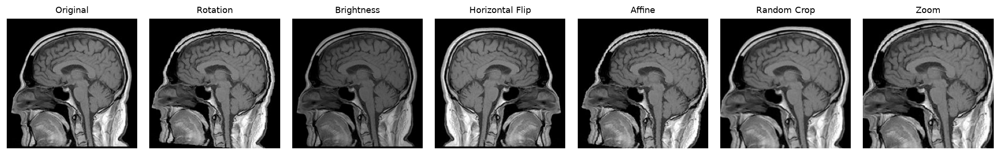

In [30]:
def augmentation_preview(frame: pd.DataFrame) -> None:
    """Show augmentation examples for one random image."""
    sample = frame[frame["readable"]].sample(1, random_state=SEED).iloc[0]
    img = Image.open(sample.image_path).convert("RGB")

    if TORCH_AVAILABLE:
        transforms = {
            "Original": lambda x: x,
            "Rotation": T.RandomRotation(degrees=15),
            "Brightness": T.ColorJitter(brightness=0.35),
            "Horizontal Flip": T.RandomHorizontalFlip(p=1.0),
            "Affine": T.RandomAffine(degrees=8, translate=(0.05, 0.05), scale=(0.95, 1.08)),
            "Random Crop": T.RandomResizedCrop(size=img.size[::-1], scale=(0.75, 1.0)),
            "Zoom": T.RandomAffine(degrees=0, scale=(1.15, 1.15)),
        }
        images = [(name, transform(img)) for name, transform in transforms.items()]
    else:
        print("torchvision unavailable; using PIL fallback transforms for preview.")
        images = [
            ("Original", img),
            ("Rotation", img.rotate(15)),
            ("Brightness", ImageEnhance.Brightness(img).enhance(1.35)),
            ("Horizontal Flip", ImageOps.mirror(img)),
            ("Affine", img.transform(img.size, Image.AFFINE, (1, 0.04, -4, 0.02, 1, -4))),
            ("Random Crop", img.crop((10, 10, img.width - 10, img.height - 10)).resize(img.size)),
            ("Zoom", img.resize((int(img.width * 1.15), int(img.height * 1.15))).crop((0, 0, img.width, img.height))),
        ]

    fig, axes = plt.subplots(1, len(images), figsize=(15, 3))
    for ax, (name, transformed) in zip(axes, images):
        ax.imshow(transformed)
        ax.set_title(name, fontsize=9)
        ax.axis("off")
    plt.tight_layout()
    plt.show()


augmentation_preview(df)


## 21 Preprocessing Preview

The preprocessing preview demonstrates resizing, center cropping, and normalization. The difference image helps reveal how much spatial or intensity information changes under the proposed pipeline.


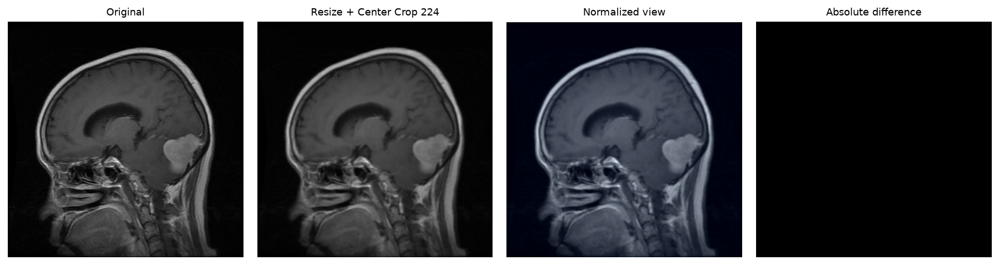

Resize standardizes tensor shape; center crop controls framing; normalization stabilizes optimization for pretrained CNNs.


In [32]:
def preprocessing_preview(frame: pd.DataFrame, target_size: int = 224) -> None:
    """Show original, resized/cropped, normalized, and difference views."""
    sample = frame[frame["readable"]].sample(1, random_state=SEED + 2).iloc[0]
    original = Image.open(sample.image_path).convert("RGB")
    processed = ImageOps.fit(original, (target_size, target_size), method=Image.BILINEAR, centering=(0.5, 0.5))
    arr_orig = np.asarray(ImageOps.fit(original, (target_size, target_size), method=Image.BILINEAR)).astype(np.float32) / 255.0
    arr_proc = np.asarray(processed).astype(np.float32) / 255.0
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    normalized = np.clip(((arr_proc - mean) / std - (-2.0)) / 4.0, 0, 1)
    difference = np.abs(arr_proc - arr_orig)

    fig, axes = plt.subplots(1, 4, figsize=(13, 3.5))
    for ax, image, title in [
        (axes[0], original, "Original"),
        (axes[1], processed, f"Resize + Center Crop {target_size}"),
        (axes[2], normalized, "Normalized view"),
        (axes[3], difference, "Absolute difference"),
    ]:
        ax.imshow(image)
        ax.set_title(title, fontsize=9)
        ax.axis("off")
    plt.tight_layout()
    plt.show()
    print("Resize standardizes tensor shape; center crop controls framing; normalization stabilizes optimization for pretrained CNNs.")


preprocessing_preview(df)


## 22 Recommendations

The recommendations below are generated from the EDA metrics. They are intended as a practical preprocessing and modeling checklist before training.


In [33]:
def generate_recommendations(frame: pd.DataFrame, metrics: pd.DataFrame, border_metrics: pd.DataFrame, class_counts: pd.DataFrame) -> List[str]:
    """Create data-driven preprocessing recommendations."""
    recommendations = []
    median_w, median_h = int(frame["width"].median()), int(frame["height"].median())
    common_resolution = frame["resolution"].mode().iloc[0]
    min_class = class_counts["total_count"].min()
    max_class = class_counts["total_count"].max()
    imbalance = max_class / min_class
    border_tail = (border_metrics["border_fraction"] > 0.20).mean()
    rgb_gray_rate = color_metrics["rgb_channels_identical"].mean() if "color_metrics" in globals() else np.nan

    target = 224 if max(median_w, median_h) >= 224 else 160
    recommendations.append(f"Use a target input resolution around {target}x{target}; median native resolution is {median_w}x{median_h}, and the most common resolution is {common_resolution}.")
    recommendations.append("Resize all images consistently; preserve aspect ratio with padding or center crop after reviewing border behavior.")
    recommendations.append("Normalize grayscale/RGB intensities because brightness and contrast vary across images.")
    if border_tail > 0.05:
        recommendations.append(f"Review border removal: {border_tail:.1%} of sampled images have more than 20% estimated dark border.")
    else:
        recommendations.append("Border removal is not mandatory globally, but retain border checks in the preprocessing QA pipeline.")
    if imbalance > 1.5:
        recommendations.append(f"Use stratified splits and class-weighted loss or balanced sampling; max/min class ratio is {imbalance:.2f}.")
    else:
        recommendations.append("Class counts are close enough for standard stratified training, with macro metrics still recommended.")
    if not np.isnan(rgb_gray_rate) and rgb_gray_rate > 0.90:
        recommendations.append("Consider single-channel grayscale training or duplicate grayscale to three channels for pretrained models; most RGB images appear channel-identical.")
    else:
        recommendations.append("Retain RGB loading for compatibility, but verify whether channels provide independent information.")
    recommendations.append("Use clinically conservative augmentation: mild rotation, small translations, brightness/contrast jitter, and cautious flipping only if anatomically justified.")
    recommendations.append("Audit any cross-split duplicate findings before training to avoid leakage.")
    recommendations.append("Monitor split shift in brightness, contrast, sharpness, and resolution; use external validation if possible.")
    return recommendations


recommendations = generate_recommendations(df, metrics_df, border_df, class_distribution)
for idx, item in enumerate(recommendations, start=1):
    print(f"{idx}. {item}")


1. Use a target input resolution around 224x224; median native resolution is 512x512, and the most common resolution is 512x512.
2. Resize all images consistently; preserve aspect ratio with padding or center crop after reviewing border behavior.
3. Normalize grayscale/RGB intensities because brightness and contrast vary across images.
4. Review border removal: 40.1% of sampled images have more than 20% estimated dark border.
5. Class counts are close enough for standard stratified training, with macro metrics still recommended.
6. Consider single-channel grayscale training or duplicate grayscale to three channels for pretrained models; most RGB images appear channel-identical.
7. Use clinically conservative augmentation: mild rotation, small translations, brightness/contrast jitter, and cautious flipping only if anatomically justified.
8. Audit any cross-split duplicate findings before training to avoid leakage.
9. Monitor split shift in brightness, contrast, sharpness, and resolution

## 23 Final Summary

This final report condenses the EDA into a research-style readiness statement. Re-run this cell after executing all previous sections so the values reflect the current dataset and configuration.


In [35]:
def final_summary_report() -> str:
    """Generate a concise markdown summary from computed EDA artifacts."""
    total = len(df)
    train = int((df["split"] == "Training").sum())
    test = int((df["split"] == "Testing").sum())
    quality_issues = int(quality_df["has_issue"].sum())
    exact_cross = leakage_findings["cross_split_exact_duplicate_hashes"]
    near_cross = leakage_findings["cross_split_near_duplicate_pairs"]
    median_resolution = f"{int(df['width'].median())}x{int(df['height'].median())}"
    class_table = class_distribution.sort_values("class").to_markdown(index=False)
    recommended_model = "EfficientNet/ResNet-style CNN baseline with ImageNet initialization, followed by a medical-imaging-specific architecture comparison."
    ready = quality_issues == 0 and exact_cross == 0

    report = f"""
### Dataset Quality

- Total images: {total:,}
- Training images: {train:,}
- Testing images: {test:,}
- Quality issues flagged: {quality_issues:,}
- Median resolution: {median_resolution}

### Class Distribution

{class_table}

### Image Statistics

- Mean brightness: {metrics_df['brightness'].mean():.2f}
- Mean contrast: {metrics_df['contrast'].mean():.2f}
- Mean entropy: {metrics_df['entropy'].mean():.2f}
- Median sharpness: {metrics_df['sharpness_laplacian_var'].median():.2f}

### Potential Risks

- Cross-split exact duplicate hash groups: {exact_cross}
- Cross-split near-duplicate pairs: {near_cross}
- Split shift should be reviewed using the statistical table above.
- Border artifacts and grayscale-as-RGB storage should be considered during preprocessing.

### Recommended Preprocessing

- Standardize image size using resize plus center crop or padding.
- Normalize intensities and preserve reproducible train/validation/test transforms.
- Apply conservative augmentation after clinical plausibility review.
- Remove or group duplicates before final model selection.

### Recommended Model

{recommended_model}

### Expected Challenges

- Distinguishing true tumor morphology from acquisition artifacts.
- Managing class-level brightness, contrast, and sharpness differences.
- Avoiding optimistic performance from duplicate or near-duplicate leakage.

### Ready for Training

{"Yes, with the preprocessing and leakage controls above." if ready else "Not yet; resolve flagged quality or leakage issues before final training."}
"""
    return report


from IPython.display import Markdown, display
display(Markdown(final_summary_report()))


ImportError: `Import tabulate` failed.  Use pip or conda to install the tabulate package.